<a href="https://colab.research.google.com/github/yohanesnuwara/PalmCV/blob/main/plot_bounding_box.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/Agrari AI/agrari_v1.v2-version_prelim2.yolov8.zip"

Archive:  /content/drive/MyDrive/Agrari AI/agrari_v1.v2-version_prelim2.yolov8.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/Jeruk-1-3-tahun-barat_jpg.rf.80a0e5960d22295f09b36517bce42b19.jpg  
 extracting: test/images/Jeruk-11-3-tahun-selatan_jpg.rf.5dafd98c416259ac990be91528b0c78a.jpg  
 extracting: test/images/Jeruk-13-3-tahun-selatan_jpg.rf.5e3eedd0220a3013b58fc69e397c02ef.jpg  
 extracting: test/images/Jeruk-13-3-tahun-timur_jpg.rf.9676baa0298d329f9cc107feec7624f3.jpg  
 extracting: test/images/Jeruk-14-3-tahun-barat_jpg.rf.d8ad238d11affdb408d7e475c7dc6372.jpg  
 extracting: test/images/Jeruk-2-4-tahun-selatan_jpg.rf.8987ec8a867084dfa765d4a7e6ac36a6.jpg  
 extracting: test/images/Jeruk-21-3-tahun-selatan_jpg.rf.1aad5f43c725b919b6086d345a0880d0.jpg  
 extracting: test/images/Jeruk-22-3-tahun-barat_jpg.rf.bbde1088c0113e1d1ebe7fa14c35bf72.jpg  


In [3]:
import cv2
img = cv2.imread("/content/test/images/Jeruk-14-3-tahun-barat_jpg.rf.d8ad238d11affdb408d7e475c7dc6372.jpg")

In [4]:
f = open("/content/test/labels/Jeruk-14-3-tahun-barat_jpg.rf.d8ad238d11affdb408d7e475c7dc6372.txt")
boxes = f.readlines()
print(boxes)

['9 0.5919183673469388 0.43533482142857144 0.0396938775510205 0.01889632936507938\n', '3 0.6566938775510204 0.45832093253968254 0.024045918367346996 0.011292162698412747\n', '9 0.7081632653061225 0.45891617063492063 0.038816326530612205 0.020476190476190464\n', '7 0.46001530612244895 0.4699156746031746 0.018147959183673436 0.008871527777777773\n', '3 0.7975918367346939 0.5131076388888889 0.02260714285714283 0.011512896825396843\n', '6 0.7228010204081633 0.6053546626984126 0.034882653061224435 0.013851686507936598\n', '14 0.603454081632653 0.7442857142857143 0.01931632653061231 0.00962549603174613\n', '3 0.7169132653061225 0.7307266865079365 0.021979591836734657 0.010788690476190476\n', '3 0.3688826530612245 0.3902480158730159 0.028316326530612244 0.015052083333333346\n', '3 0.2933724489795918 0.4065029761904762 0.022020408163265347 0.010855654761904757\n', '3 0.7212448979591837 0.42734623015873013 0.02988775510204078 0.014308035714285728\n', '3 0.7904591836734693 0.5234052579365079 0.0

In [5]:
box_list = []
for box in boxes:
  box.replace("\n","")
  label, x,y,w,h = map(float, box.split(" "))
  box_list.append([int(label), x,y,w,h])

In [6]:
print(box_list)

[[9, 0.5919183673469388, 0.43533482142857144, 0.0396938775510205, 0.01889632936507938], [3, 0.6566938775510204, 0.45832093253968254, 0.024045918367346996, 0.011292162698412747], [9, 0.7081632653061225, 0.45891617063492063, 0.038816326530612205, 0.020476190476190464], [7, 0.46001530612244895, 0.4699156746031746, 0.018147959183673436, 0.008871527777777773], [3, 0.7975918367346939, 0.5131076388888889, 0.02260714285714283, 0.011512896825396843], [6, 0.7228010204081633, 0.6053546626984126, 0.034882653061224435, 0.013851686507936598], [14, 0.603454081632653, 0.7442857142857143, 0.01931632653061231, 0.00962549603174613], [3, 0.7169132653061225, 0.7307266865079365, 0.021979591836734657, 0.010788690476190476], [3, 0.3688826530612245, 0.3902480158730159, 0.028316326530612244, 0.015052083333333346], [3, 0.2933724489795918, 0.4065029761904762, 0.022020408163265347, 0.010855654761904757], [3, 0.7212448979591837, 0.42734623015873013, 0.02988775510204078, 0.014308035714285728], [3, 0.7904591836734693

In [7]:
def unconvert(class_id, width, height, x, y, w, h):

    xmax = int((x*width) + (w * width)/2.0)
    xmin = int((x*width) - (w * width)/2.0)
    ymax = int((y*height) + (h * height)/2.0)
    ymin = int((y*height) - (h * height)/2.0)
    class_id = int(class_id)
    return (class_id, xmin, xmax, ymin, ymax)

In [8]:
box_list_convert = []
height, width, _ = img.shape
for box in box_list:
  label, x,y,w,h = box
  label, x,y,w,h = unconvert(label, width, height, x,y,w,h)
  box_list_convert.append([label, x,y,w,h])

In [9]:
print(box_list_convert)

[[9, 1121, 1199, 1717, 1793], [3, 1263, 1310, 1825, 1870], [9, 1349, 1426, 1809, 1891], [7, 883, 919, 1876, 1912], [3, 1541, 1585, 2045, 2092], [6, 1382, 1450, 2412, 2468], [14, 1163, 1201, 2981, 3020], [3, 1383, 1426, 2924, 2968], [3, 695, 750, 1543, 1603], [3, 553, 596, 1617, 1660], [3, 1384, 1442, 1694, 1751], [3, 1527, 1570, 2090, 2130], [0, 713, 747, 1371, 1398], [0, 929, 961, 1328, 1359], [0, 607, 634, 1681, 1709], [0, 784, 818, 1671, 1699], [0, 1048, 1081, 1333, 1367], [0, 1101, 1130, 1342, 1367], [0, 1325, 1355, 1367, 1396], [0, 1218, 1245, 1408, 1428], [0, 1205, 1219, 1344, 1363], [0, 1041, 1061, 1485, 1506], [0, 916, 948, 1505, 1538], [0, 898, 928, 1564, 1593], [0, 1018, 1049, 1650, 1675], [0, 1189, 1217, 1554, 1582], [0, 1141, 1168, 1563, 1584], [0, 1287, 1321, 2089, 2122], [0, 666, 697, 1936, 1969], [0, 754, 778, 1916, 1943], [0, 765, 787, 1857, 1880], [0, 624, 653, 1832, 1861], [0, 608, 628, 1826, 1846], [0, 592, 629, 2068, 2101], [0, 744, 760, 2799, 2820], [0, 1348, 1380,

In [33]:
def plot(image, list_points):
  
  color = (255, 255, 0)
  thickness = 3
  font = cv2.FONT_HERSHEY_SIMPLEX
  fontScale = 0.2
  # thickness = 1

  for point in list_points:

      text = str(point[0])
      # print(text)
      image = cv2.rectangle(image, (int(point[1]), int(point[3])), (int(point[2]), int(point[4])), color, thickness)
      # cv2.putText(image, text, (int(point[1]), int(point[3]-5)), font, fontScale, color, thickness, cv2.LINE_AA, False)
  return image

In [34]:
img_vis = plot(img, box_list_convert)
# cv2.imwrite("out.png", img_vis)

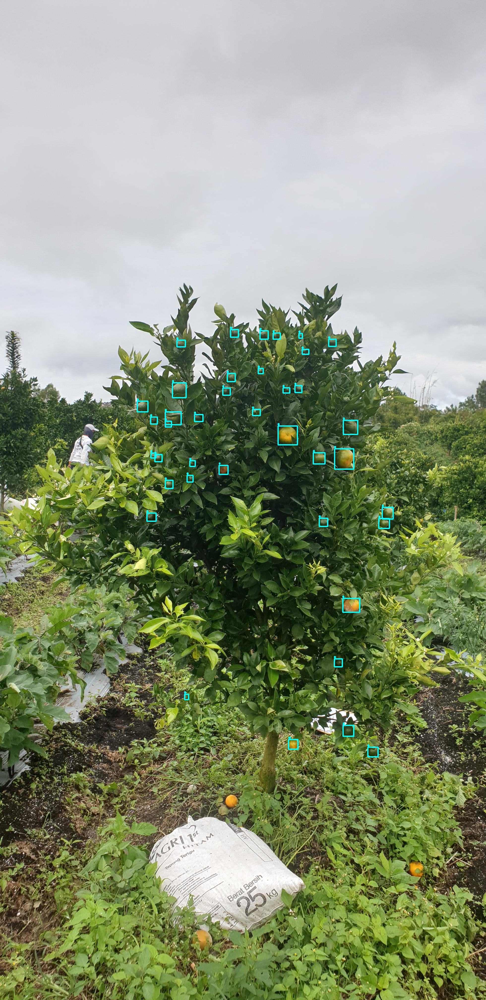

In [35]:
from google.colab.patches import cv2_imshow

cv2_imshow(img_vis)